In [39]:
# from jax.config import config
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# import moscot as mt
import squidpy as sq
import numpy as np
from pathlib import Path
import pickle
import scipy
import scanpy as sc
import matplotlib.pyplot as plt
from anndata import AnnData
import cellrank as cr
import pandas as pd

import mplscience
import matplotlib.pyplot as plt

mplscience.available_styles()
mplscience.set_style(reset_current=True)
plt.rcParams["legend.scatterpoints"] = 1

# config.update("jax_enable_x64", True)
# # sc.set_figure_params()
%load_ext autoreload
%autoreload 2
%load_ext lab_black

['default', 'despine']
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The lab_black extension is already loaded. To reload it, use:
  %reload_ext lab_black


In [2]:
adata = sc.read(
    "/lustre/groups/ml01/workspace/moscot_paper/mosta/mosta_filter_umap.h5ad"
)
adata.obs.timepoint.unique()
adata.obs["timepoints"] = adata.obs.timepoint.cat.codes

In [3]:
tmats_map = {
    (0, 1): "E9.5",
    (1, 2): "E10.5",
    (2, 3): "E11.5",
    (3, 4): "E12.5",
    (4, 5): "E13.5",
    (5, 6): "E14.5",
    (6, 7): "E15.5",
}


## Build transtition matrix

In [4]:
import os

path = Path("/lustre/groups/ml01/workspace/moscot_paper/mosta/tmats")
tmats = {
    "E14.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.5_tp_5_transition-002.pkl",
    "E9.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.25_tp_0_transition.pkl",
    "E15.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.5_tp_6_transition-003.pkl",
    "E11.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.25_tp_2_transition.pkl",
    "E10.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.25_tp_1_transition.pkl",
    "E13.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.25_tp_4_transition.pkl",
    "E12.5": "mouse_embryo_eps_0.001_rank_100_gamma_100_alpha_0.5_tp_3_transition.pkl",
}
tadatas = {}
for (src, tgt), v in list(tmats_map.items()):
    print(src, tgt, v)
    temp_mat = np.load(path / tmats[v], allow_pickle=True)
    obs = pd.DataFrame(index=adata.obs_names[adata.obs.timepoints == src].copy())
    var = pd.DataFrame(index=adata.obs_names[adata.obs.timepoints == tgt].copy())
    tadatas[(src, tgt)] = AnnData(X=temp_mat, obs=obs, var=var)

0 1 E9.5
1 2 E10.5
2 3 E11.5
3 4 E12.5
4 5 E13.5
5 6 E14.5
6 7 E15.5


In [5]:
tadatas

{(0, 1): AnnData object with n_obs × n_vars = 5870 × 18292,
 (1, 2): AnnData object with n_obs × n_vars = 18292 × 29972,
 (2, 3): AnnData object with n_obs × n_vars = 29972 × 51201,
 (3, 4): AnnData object with n_obs × n_vars = 51201 × 76717,
 (4, 5): AnnData object with n_obs × n_vars = 76717 × 102467,
 (5, 6): AnnData object with n_obs × n_vars = 102467 × 112685,
 (6, 7): AnnData object with n_obs × n_vars = 112685 × 121480}

## Create Kernel for Cellrank

In [6]:
from typing import *
from types import MappingProxyType
import anndata


class MostaKernel(cr.kernels.TransportMapKernel):
    def compute_transition_matrix(
        self,
        tmaps: Dict[Tuple[float, float], anndata.AnnData],
        threshold: Optional[str] = "auto",
        self_transitions: Union[
            Literal["uniform", "diagonal", "connectivities", "all"],
            Sequence[float],
        ] = "connectivities",
        conn_weight: Optional[float] = None,
        conn_kwargs: Mapping[str, Any] = MappingProxyType({}),
    ):
        self._tmaps = tmaps

        if threshold is not None:
            self._threshold_transport_maps(
                self.transport_maps, threshold=threshold, copy=False
            )

        tmap = self._restich_tmaps(
            self.transport_maps,
            self_transitions=self_transitions,
            conn_weight=conn_weight,
            **conn_kwargs,
        )

        self.transition_matrix = tmap.X
        return self

    def _compute_tmap(self):
        raise NotImplementedError()

In [7]:
ck = MostaKernel(adata, time_key="timepoints").compute_transition_matrix(
    tadatas, self_transitions="connectivities"
)
conn = cr.kernels.ConnectivityKernel(adata).compute_transition_matrix()
kernel = 0.9 * ck + 0.1 * conn

  0%|          | 0/200 [00:00<?, ?sim/s]

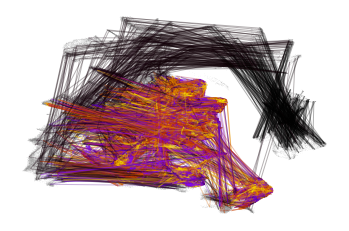

In [8]:
kernel.plot_random_walks(
    200, max_iter=500, basis="umap", start_ixs={"timepoints": 0}, n_jobs=10
)

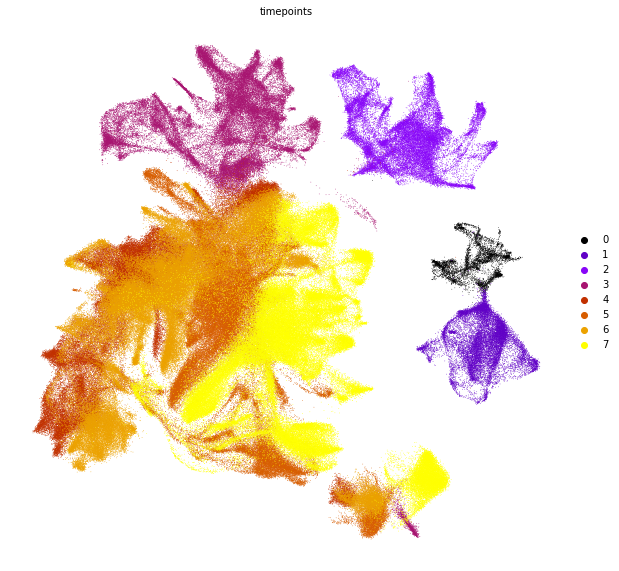

In [9]:
import scvelo as scv

scv.pl.scatter(adata, c="timepoints", legend_loc="right", figsize=(10, 10), s=2)

## Run estimator

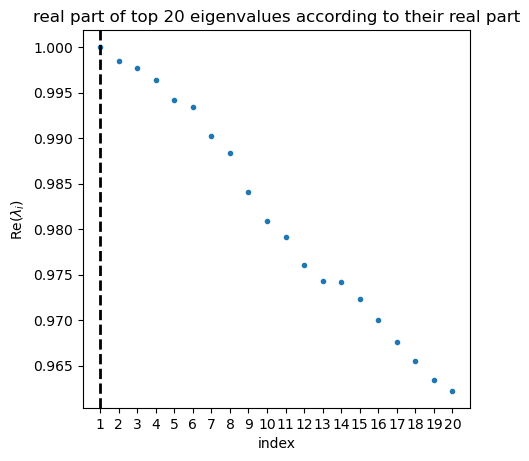

In [10]:
from cellrank.estimators import GPCCA

g = GPCCA(kernel)
g.compute_schur()
g.plot_spectrum(real_only=True)

/home/icb/giovanni.palla/miniconda3/envs/moscot/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


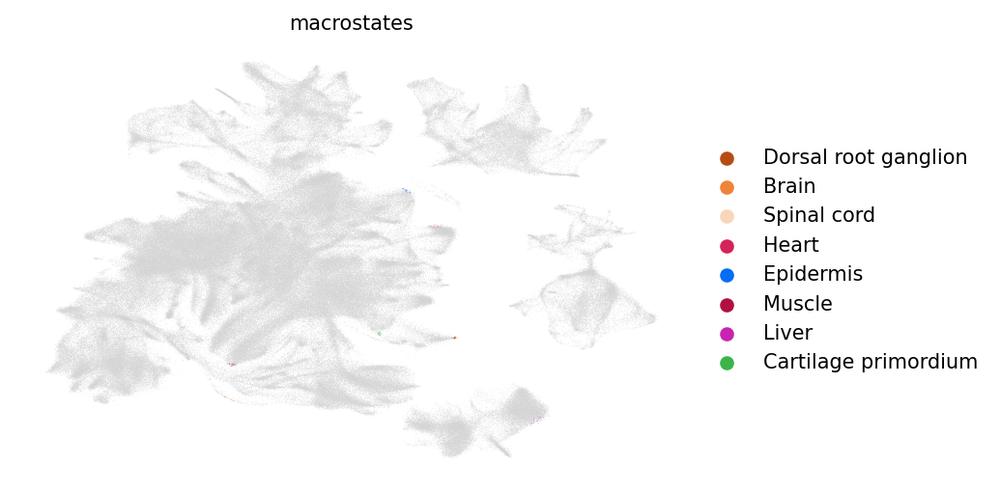

In [11]:
g.compute_macrostates(n_states=8, cluster_key="annotation")
g.plot_macrostates(legend_loc="right", dpi=150)

/home/icb/giovanni.palla/miniconda3/envs/moscot/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


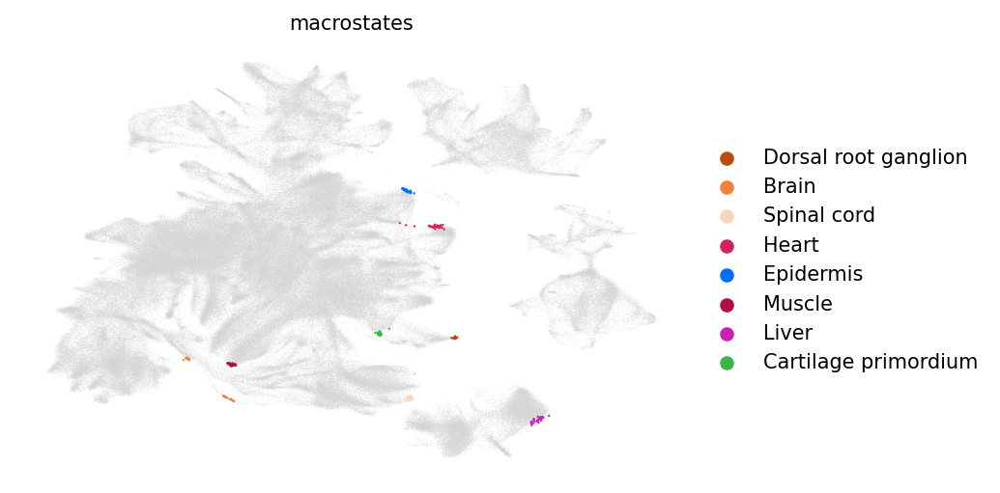

In [12]:
g.plot_macrostates(legend_loc="right", dpi=150, s=5)

In [13]:
g.set_terminal_states_from_macrostates(names=None)

GPCCA[kernel=(0.9 * MostaKernel[n=518684] + 0.1 * ConnectivityKernel[n=518684]), terminal_states=['Brain', 'Cartilage primordium', 'Dorsal root ganglion', 'Epidermis', 'Heart', 'Liver', 'Muscle', 'Spinal cord'], macrostates=['Brain', 'Cartilage primordium', 'Dorsal root ganglion', 'Epidermis', 'Heart', 'Liver', 'Muscle', 'Spinal cord']]

In [14]:
g.compute_absorption_probabilities(n_jobs=10)

  0%|          | 0/8 [00:00<?, ?/s]

/home/icb/giovanni.palla/miniconda3/envs/moscot/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


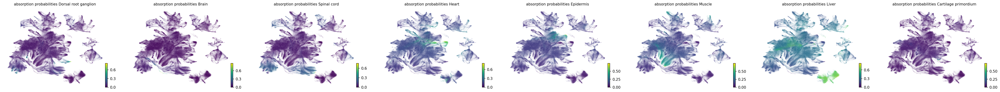

In [15]:
g.plot_absorption_probabilities(same_plot=False, dpi=150)

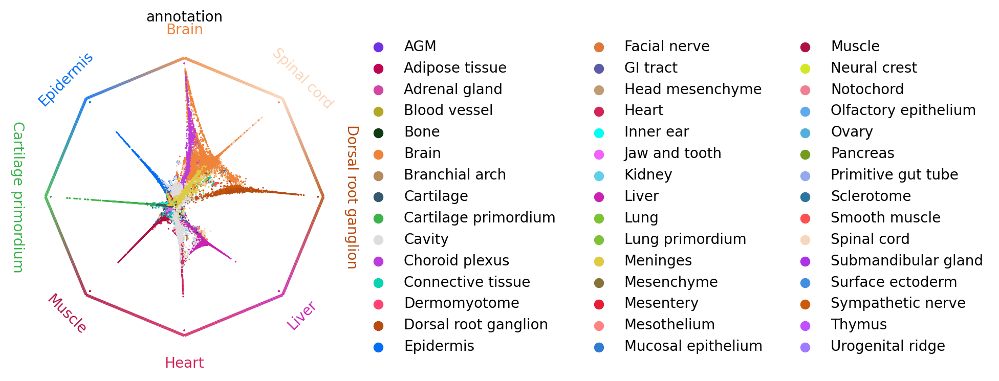

In [16]:
cr.pl.circular_projection(
    adata, keys="annotation", legend_loc="right", figsize=(20, 20), dpi=200, s=5
)

In [17]:
g.compute_lineage_priming(method="entropy")

cell_name
147_104-0    0.097748
147_105-0    0.100158
147_106-0    0.047606
147_107-0    0.074471
147_108-0    0.081388
               ...   
700_235-7    0.074062
700_236-7    0.072599
700_237-7    0.076290
700_238-7    0.074868
700_239-7    0.076077
Length: 518684, dtype: float64

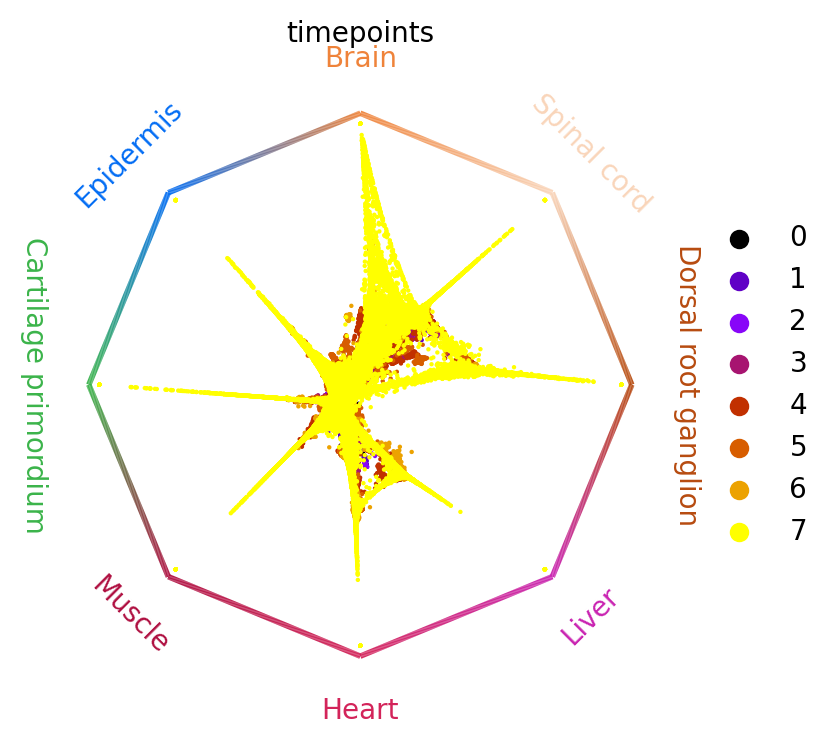

In [18]:
cr.pl.circular_projection(
    adata, keys="timepoints", legend_loc="right", figsize=(20, 20), dpi=200, s=10
)

/home/icb/giovanni.palla/miniconda3/envs/moscot/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


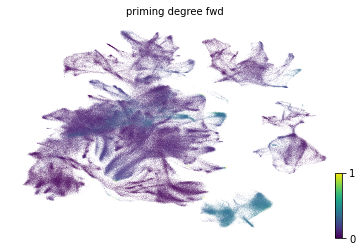

In [19]:
scv.pl.scatter(adata, c="priming_degree_fwd", color_map="viridis")

## Compute lineage drivers

In [20]:
corrs = g.compute_lineage_drivers()
corrs.head()

,Dorsal root ganglion_corr,Dorsal root ganglion_pval,Dorsal root ganglion_qval,Dorsal root ganglion_ci_low,Dorsal root ganglion_ci_high,Brain_corr,Brain_pval,Brain_qval,Brain_ci_low,Brain_ci_high,...,Liver_corr,Liver_pval,Liver_qval,Liver_ci_low,Liver_ci_high,Cartilage primordium_corr,Cartilage primordium_pval,Cartilage primordium_qval,Cartilage primordium_ci_low,Cartilage primordium_ci_high
gene_short_name,,,,,,,,,,,,,,,,,,,,,
Nefl,0.524655,0.0,0.0,0.522680,0.526625,0.146093,0.0,0.0,0.143428,0.148755,...,-0.201710,0.0,0.0,-0.204319,-0.199098,-0.115146,0.0,0.0,-0.117831,-0.112460
Stmn2,0.509802,0.0,0.0,0.507785,0.511813,0.361012,0.0,0.0,0.358643,0.363377,...,-0.299156,0.0,0.0,-0.301631,-0.296676,-0.203231,0.0,0.0,-0.205839,-0.200621
Gap43,0.494574,0.0,0.0,0.492515,0.496627,0.311621,0.0,0.0,0.309162,0.314076,...,-0.285134,0.0,0.0,-0.287632,-0.282632,-0.169518,0.0,0.0,-0.172160,-0.166874
Tubb3,0.490380,0.0,0.0,0.488310,0.492444,0.423501,0.0,0.0,0.421265,0.425731,...,-0.302373,0.0,0.0,-0.304843,-0.299898,-0.210742,0.0,0.0,-0.213341,-0.208140
Tuba1a,0.477852,0.0,0.0,0.475749,0.479949,0.453655,0.0,0.0,0.451491,0.455813,...,-0.382675,0.0,0.0,-0.384995,-0.380349,-0.180659,0.0,0.0,-0.183291,-0.178025


In [43]:
pd.set_option("display.max_columns", 50)
corrs.sort_values(by="Heart_corr", ascending=False).head(50)

,Dorsal root ganglion_corr,Dorsal root ganglion_pval,Dorsal root ganglion_qval,Dorsal root ganglion_ci_low,Dorsal root ganglion_ci_high,Brain_corr,Brain_pval,Brain_qval,Brain_ci_low,Brain_ci_high,Spinal cord_corr,Spinal cord_pval,Spinal cord_qval,Spinal cord_ci_low,Spinal cord_ci_high,Heart_corr,Heart_pval,Heart_qval,Heart_ci_low,Heart_ci_high,Epidermis_corr,Epidermis_pval,Epidermis_qval,Epidermis_ci_low,Epidermis_ci_high,Muscle_corr,Muscle_pval,Muscle_qval,Muscle_ci_low,Muscle_ci_high,Liver_corr,Liver_pval,Liver_qval,Liver_ci_low,Liver_ci_high,Cartilage primordium_corr,Cartilage primordium_pval,Cartilage primordium_qval,Cartilage primordium_ci_low,Cartilage primordium_ci_high
gene_short_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Hba-a1,-0.342394,0.000000e+00,0.000000e+00,-0.344795,-0.339990,-0.340029,0.000000e+00,0.000000e+00,-0.342434,-0.337620,-0.390907,0.000000e+00,0.000000e+00,-0.393210,-0.388599,0.514960,0.0,0.0,0.512958,0.516957,-0.211436,0.000000e+00,0.000000e+00,-0.214034,-0.208834,-0.302390,0.000000e+00,0.000000e+00,-0.304861,-0.299915,0.467229,0.000000e+00,0.000000e+00,0.465099,0.469354,-0.344340,0.000000e+00,0.000000e+00,-0.346737,-0.341939
Hba-a2,-0.332251,0.000000e+00,0.000000e+00,-0.334669,-0.329827,-0.326863,0.000000e+00,0.000000e+00,-0.329292,-0.324430,-0.377714,0.000000e+00,0.000000e+00,-0.380045,-0.375379,0.500003,0.0,0.0,0.497960,0.502042,-0.215117,0.000000e+00,0.000000e+00,-0.217711,-0.212520,-0.294850,0.000000e+00,0.000000e+00,-0.297333,-0.292364,0.456850,0.000000e+00,0.000000e+00,0.454694,0.459001,-0.335382,0.000000e+00,0.000000e+00,-0.337795,-0.332964
Hbb-bt,-0.313448,0.000000e+00,0.000000e+00,-0.315900,-0.310992,-0.296237,0.000000e+00,0.000000e+00,-0.298717,-0.293752,-0.349225,0.000000e+00,0.000000e+00,-0.351613,-0.346834,0.432871,0.0,0.0,0.430657,0.435080,-0.203932,0.000000e+00,0.000000e+00,-0.206539,-0.201323,-0.284867,0.000000e+00,0.000000e+00,-0.287365,-0.282364,0.455955,0.000000e+00,0.000000e+00,0.453796,0.458108,-0.322553,0.000000e+00,0.000000e+00,-0.324989,-0.320112
Alas2,-0.170176,0.000000e+00,0.000000e+00,-0.172818,-0.167532,-0.164672,0.000000e+00,0.000000e+00,-0.167319,-0.162023,-0.175041,0.000000e+00,0.000000e+00,-0.177678,-0.172402,0.418784,0.0,0.0,0.416537,0.421026,-0.237634,0.000000e+00,0.000000e+00,-0.240200,-0.235064,-0.202572,0.000000e+00,0.000000e+00,-0.205180,-0.199961,0.208575,0.000000e+00,0.000000e+00,0.205971,0.211177,-0.221340,0.000000e+00,0.000000e+00,-0.223927,-0.218751
Hba-x,-0.105509,0.000000e+00,0.000000e+00,-0.108199,-0.102817,-0.136561,0.000000e+00,0.000000e+00,-0.139231,-0.133889,-0.128649,0.000000e+00,0.000000e+00,-0.131324,-0.125972,0.400841,0.0,0.0,0.398555,0.403123,-0.087311,0.000000e+00,0.000000e+00,-0.090011,-0.084610,-0.113343,0.000000e+00,0.000000e+00,-0.116029,-0.110656,0.020724,2.185813e-50,5.229217e-50,0.018004,0.023444,-0.141974,0.000000e+00,0.000000e+00,-0.144639,-0.139306
Hbb-y,-0.118994,0.000000e+00,0.000000e+00,-0.121676,-0.116311,-0.155549,0.000000e+00,0.000000e+00,-0.158204,-0.152893,-0.151771,0.000000e+00,0.000000e+00,-0.154429,-0.149111,0.390226,0.0,0.0,0.387916,0.392530,-0.017424,3.988679e-36,1.131540e-35,-0.020144,-0.014703,-0.118927,0.000000e+00,0.000000e+00,-0.121609,-0.116243,0.025205,1.139691e-73,2.907376e-73,0.022485,0.027925,-0.139014,0.000000e+00,0.000000e+00,-0.141681,-0.136344
Hbb-bs,-0.258701,0.000000e+00,0.000000e+00,-0.261239,-0.256160,-0.231001,0.000000e+00,0.000000e+00,-0.233575,-0.228423,-0.287910,0.000000e+00,0.000000e+00,-0.290404,-0.285412,0.353411,0.0,0.0,0.351027,0.355790,-0.155949,0.000000e+00,0.000000e+00,-0.158603,-0.153292,-0.225042,0.000000e+00,0.000000e+00,-0.227624,-0.222457,0.359639,0.000000e+00,0.000000e+00,0.357267,0.362006,-0.247235,0.000000e+00,0.000000e+00,-0.249788,-0.244678
Apex2,-0.191701,0.000000e+00,0.000000e+00,-0.194321,-0.189078,-0.191197,0.000000e+00,0.000000e+00,-0.193818,-0.188574,-0.200573,0.000000e+00,0.000000e+00,-0.203184,-0.197960,0.334230,0.0,0.0,0.331810,0.336645,-0.267815,0.000000e+00,0.000000e+00

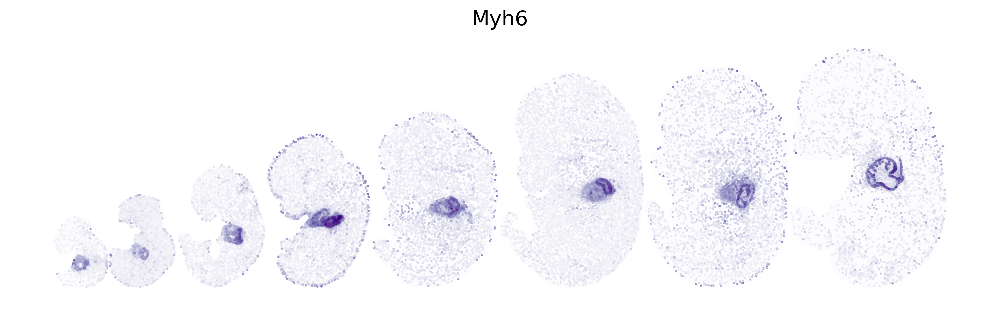

In [75]:
gene = "Myh6"
sq.pl.spatial_scatter(
    adata[adata[:, gene].X.A.flatten().argsort()],
    shape=None,
    color=gene,  # , "Myl7", "Alas2", "Gata4"],
    frameon=False,
    cmap="Purples",
    size=1,
    figsize=(18, 3),
    dpi=300,
    colorbar=False,
)

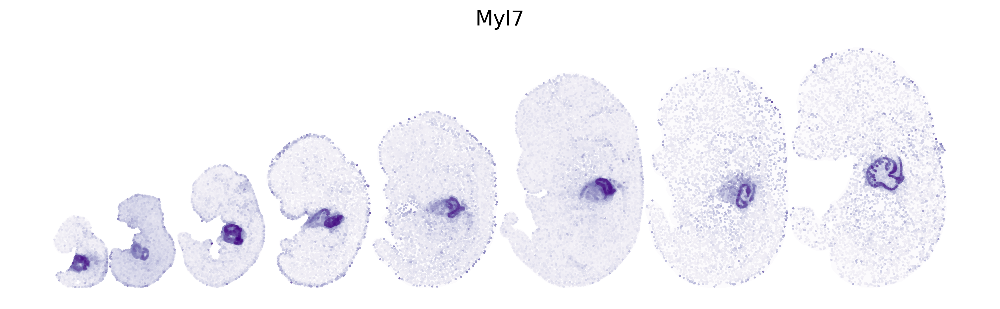

In [ ]:
gene = "Myl7"
sq.pl.spatial_scatter(
    adata[adata[:, gene].X.A.flatten().argsort()],
    shape=None,
    color=gene,  # , "Myl7", "Alas2", "Gata4"],
    frameon=False,
    cmap="Purples",
    size=1,
    figsize=(18, 3),
    dpi=300,
    colorbar=False,
)

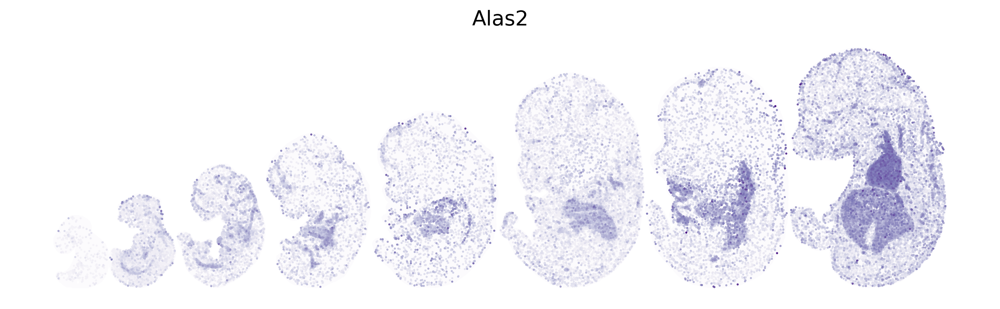

In [73]:
gene = "Alas2"
sq.pl.spatial_scatter(
    adata[adata[:, gene].X.A.flatten().argsort()],
    shape=None,
    color=gene,  # , "Myl7", "Alas2", "Gata4"],
    frameon=False,
    cmap="Purples",
    size=1,
    figsize=(18, 3),
    dpi=300,
    colorbar=False,
)

/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:825: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


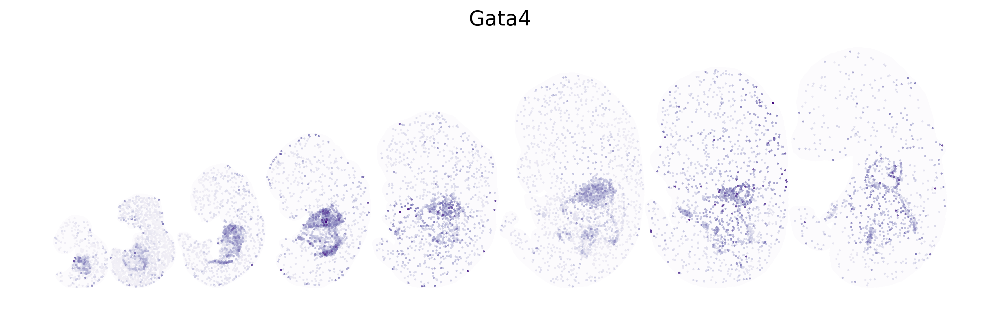

In [72]:
gene = "Gata4"
sq.pl.spatial_scatter(
    adata[adata[:, gene].X.A.flatten().argsort()],
    shape=None,
    color=gene,  # , "Myl7", "Alas2", "Gata4"],
    frameon=False,
    cmap="Purples",
    size=1,
    figsize=(18, 3),
    dpi=300,
    colorbar=False,
)

In [31]:
adata.obs["Heart_annot_plotting"] = pd.Categorical(
    adata.obs.annotation.isin(["Heart"]), categories={True: "Heart", False: np.nan}
)
adata.uns["Heart_annot_plotting_colors"] = [
    adata.uns["annotation_colors"][
        adata.obs.annotation[adata.obs.annotation.isin(["Heart"])].cat.codes[0]
    ],
    "lightgrey",
]

/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:825: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


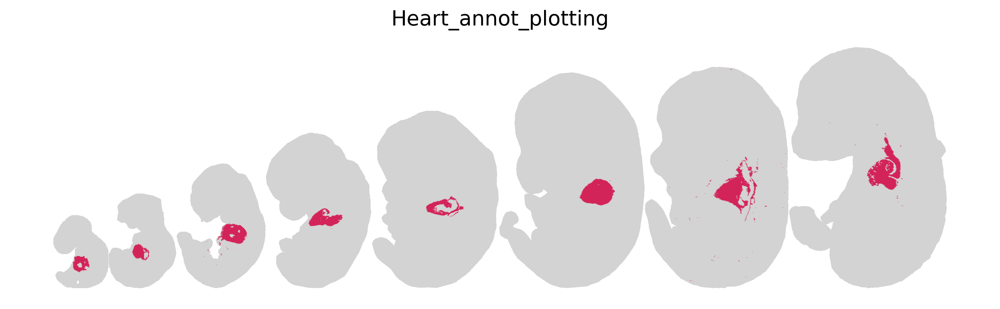

In [78]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color=["Heart_annot_plotting"],
    na_color="lightgrey",
    size=1,
    frameon=False,
    figsize=(18, 3),
    dpi=300,
    legend_loc=None,
)

In [79]:
for state in g.absorption_probabilities.names:
    adata.obs[f"fate_probs_{state}"] = g.absorption_probabilities[state].X.flatten()

In [81]:
adata.obs[f"fate_probs_Heart"]

cell_name
147_104-0    0.188589
147_105-0    0.189062
147_106-0    0.169223
147_107-0    0.186602
147_108-0    0.197264
               ...   
700_235-7    0.179010
700_236-7    0.178334
700_237-7    0.177055
700_238-7    0.178097
700_239-7    0.178105
Name: fate_probs_Heart, Length: 518684, dtype: float64

/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:825: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


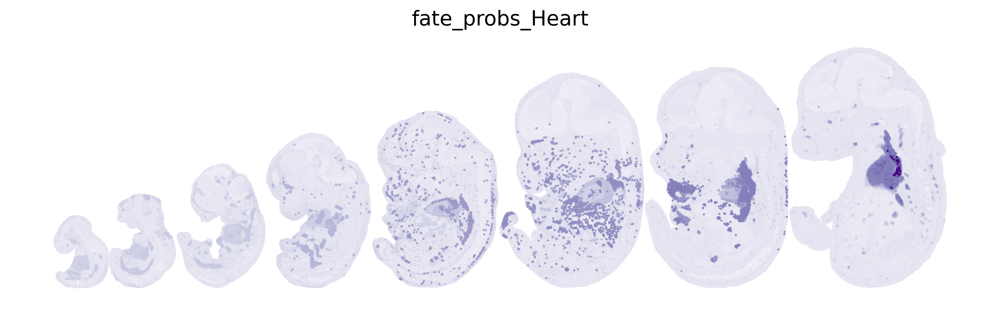

In [83]:
gene = "fate_probs_Heart"
sq.pl.spatial_scatter(
    adata[adata.obs[gene].values.flatten().argsort()],
    shape=None,
    color=gene,  # , "Myl7", "Alas2", "Gata4"],
    frameon=False,
    cmap="Purples",
    size=1,
    figsize=(18, 3),
    dpi=300,
    colorbar=False,
)

In [1]:
# import scanpy as sc
# import pandas as pd
# adata = sc.read("/lustre/groups/ml01/workspace/moscot_paper/mosta/mosta_filter_umap_OUTPUT.h5ad")
# df = pd.read_csv(
#     "/lustre/groups/ml01/workspace/moscot_paper/mosta/Mus_musculus_TF", sep="\t"
# )


In [3]:
# adata.var["gene_short_name"] = adata.var.index.copy()
# adata.var.reset_index(inplace=True, drop=True)

In [4]:
# new_var = adata.var.merge(right=df, how='left', left_on='gene_short_name', right_on='Symbol')

# # set the index back to the correct column
# new_var.set_index(keys="gene_short_name", drop=False, inplace=True)
# adata.var.set_index(keys="gene_short_name", drop=False, inplace=True)
# # make sure the index is exactly the same as in adata.var
# assert((adata.var.index == new_var.index).all()), "Indices do not fully overlap"

In [23]:
# # put the new var anntations in place
# adata.var = new_var

In [5]:
# adata.var

In [84]:
adata.write(
    "/lustre/groups/ml01/workspace/moscot_paper/mosta/mosta_filter_umap_OUTPUT.h5ad"
)

In [85]:
corrs.to_csv("/lustre/groups/ml01/workspace/moscot_paper/mosta/corr_df_drivers.csv.gz")

In [86]:
g.write("/lustre/groups/ml01/workspace/moscot_paper/mosta/gpcca.pkl")